In [1]:
%matplotlib inline

from tools import HOGFeatures
import glob
import cv2
import numpy as np
import pickle
from tools import draw_windows, get_hog_features, draw_labeled_bboxes, get_heatmap, find_bounding_boxes, y_limits
from matplotlib import pyplot as plt
from scipy.ndimage.measurements import label

In [2]:
clf = pickle.load(open("classifier.pkl", "rb"))

/home/ilya/miniconda3/envs/carnd-term1/lib/python3.5/site-packages/skimage/feature/_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)
/home/ilya/miniconda3/envs/carnd-term1/lib/python3.5/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


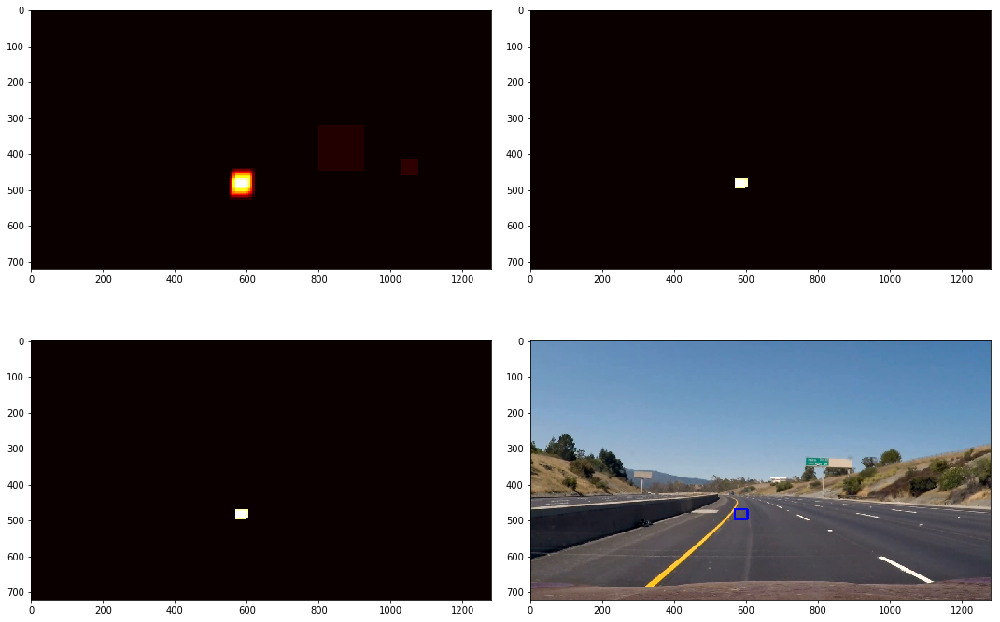

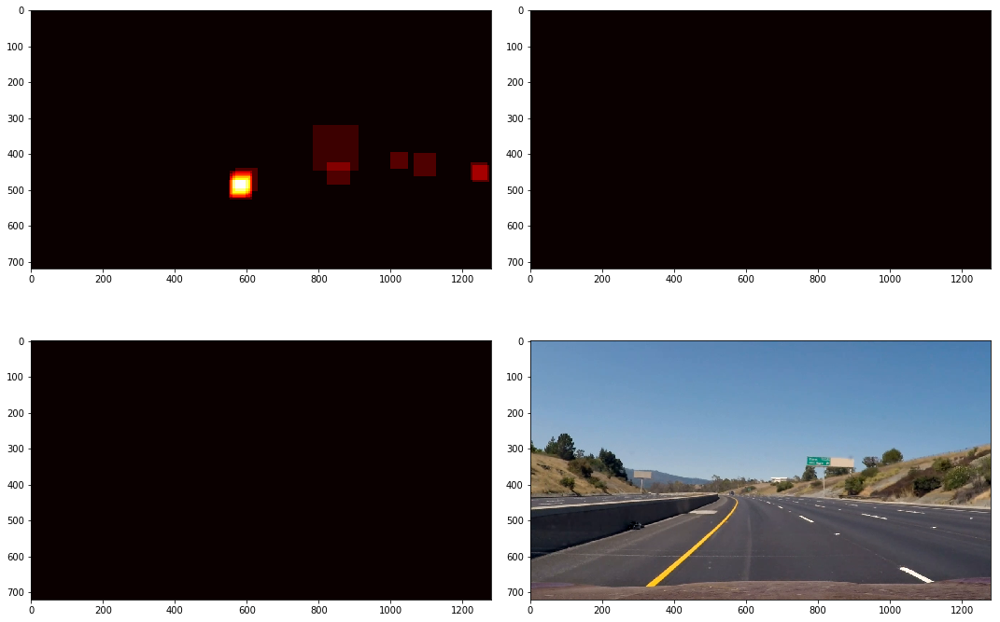

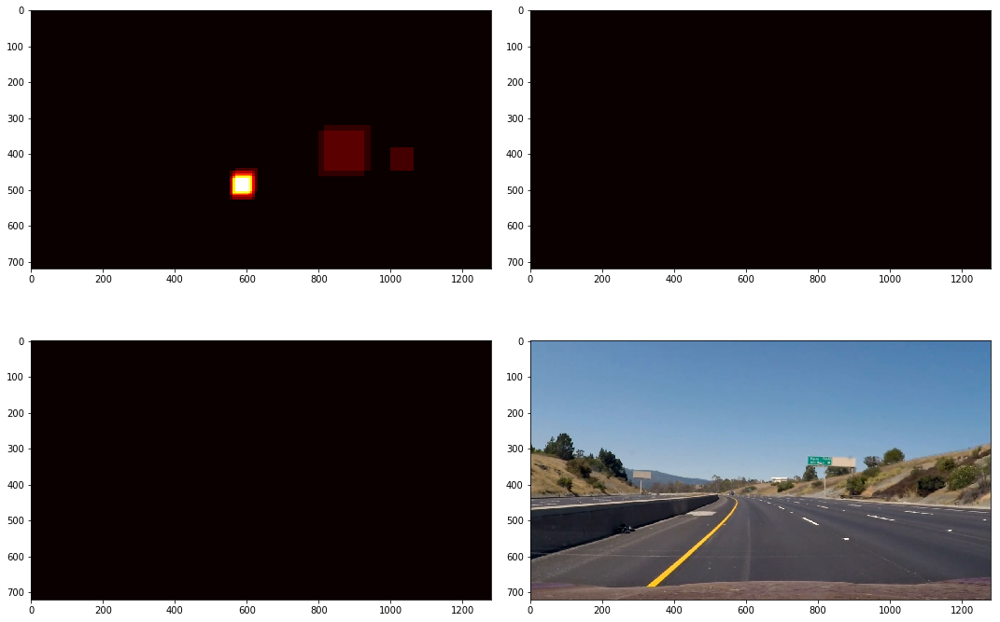

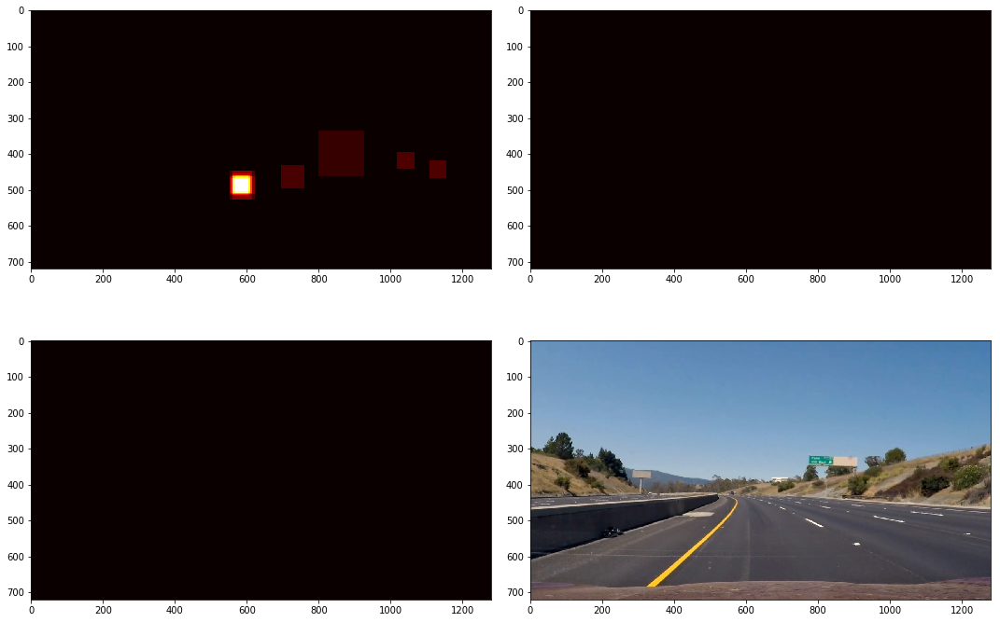

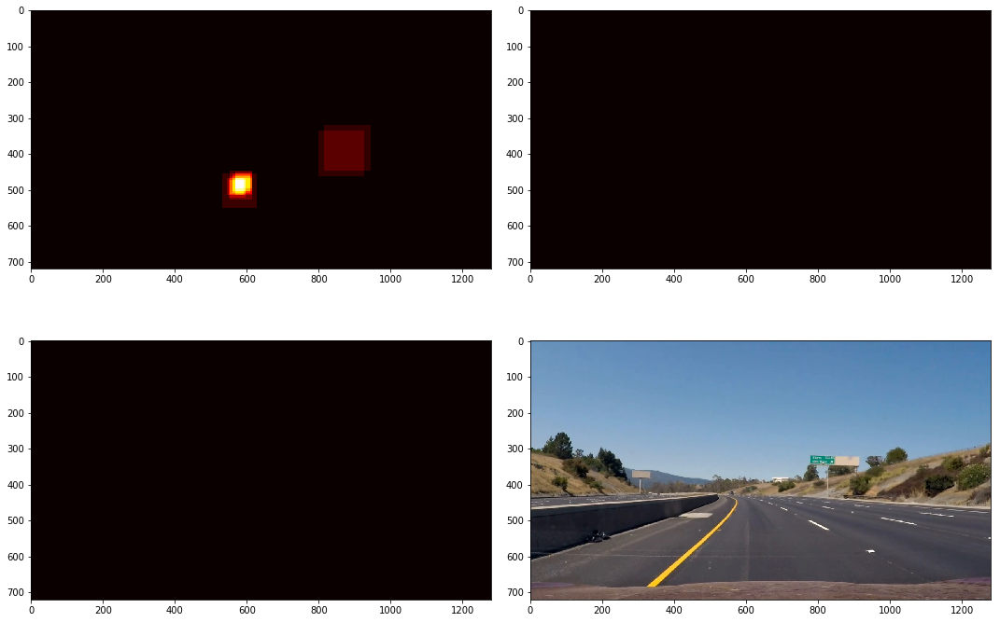

...

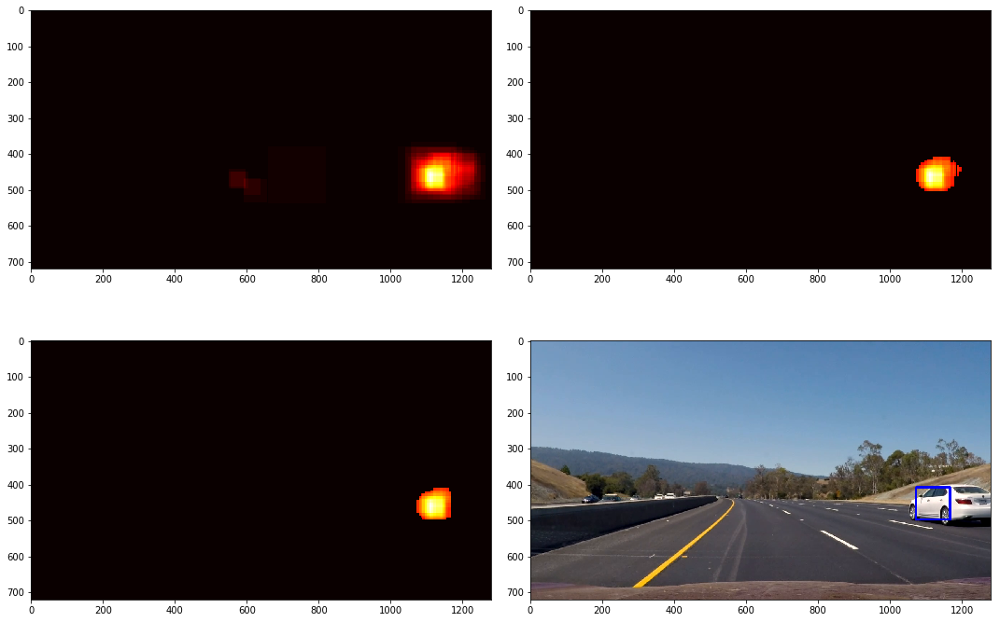

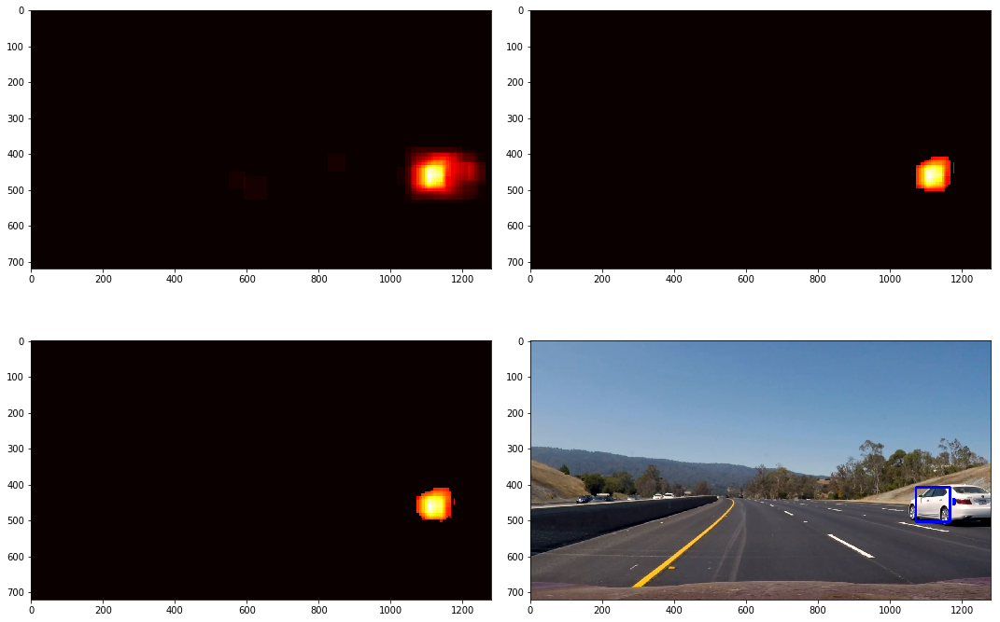

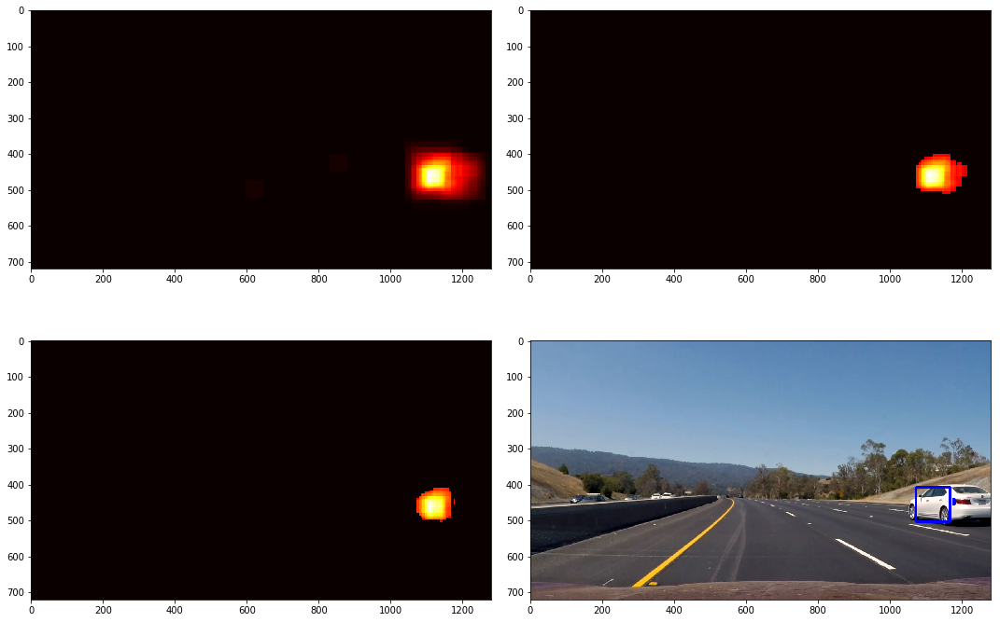

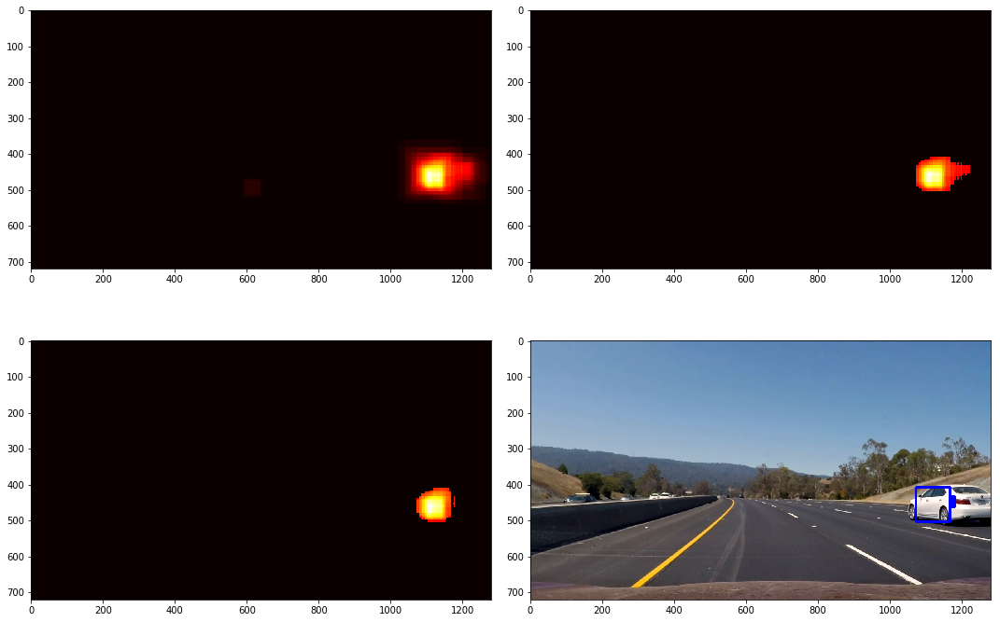

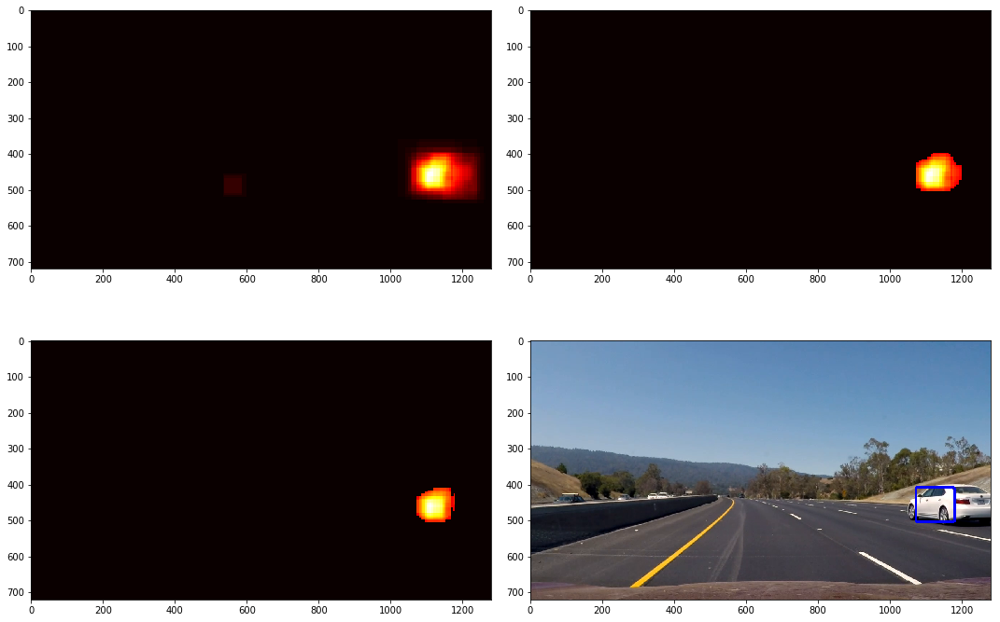

In [6]:
heatmaps = []
for path in sorted(glob.glob("test_sequence/**")):
    img = cv2.imread(path)[..., ::-1]
    
    good_windows = []
    for window_size in [48, 64, 96, 128, 160]:
        good_windows.extend(find_bounding_boxes(img, clf, window_size, x_range=[400, None], y_range=y_limits[window_size]))
    
    fig, axs = plt.subplots(2, 2, figsize=(15, 10))
    fig.tight_layout()
    
    heatmap = get_heatmap(img, good_windows)
    axs[0, 0].imshow(heatmap, cmap="hot")
    heatmap[heatmap < 0.1] = 0
    
    heatmaps.append(heatmap)
    if len(heatmaps) > 6:
        heatmaps.pop(0)

    sum_heatmap = heatmaps[0].copy()
    weight = 1
    for w, heatmap in enumerate(heatmaps[1:]):
        sum_heatmap = sum_heatmap + heatmap
        weight += 1

    sum_heatmap /= weight
    sum_heatmap[sum_heatmap < 0.1] = 0

    labels = label(sum_heatmap)
    draw_img = draw_labeled_bboxes(img, labels)
    
    axs[0, 1].imshow(heatmap, cmap="hot")
    axs[1, 0].imshow(sum_heatmap, cmap="hot")
    axs[1, 1].imshow(draw_img)